**Google Drive Bağlantısı**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!nvidia-smi

**Dosyaları Zipten Çıkarma**

In [ ]:
!cd /content
!unzip /content/drive/MyDrive/mmdet_data_f1.zip    

Archive:  /content/drive/MyDrive/mmdet_data_f1.zip
   creating: mmdet_data_f1/
   creating: mmdet_data_f1/images/
  inflating: mmdet_data_f1/images/006e241d-McLaren05301.jpg  
  inflating: mmdet_data_f1/images/0097a806-RedBull07721.jpg  
  inflating: mmdet_data_f1/images/00b39fc6-french01401.jpg  
  inflating: mmdet_data_f1/images/00c48e11-McLaren05241.jpg  
  inflating: mmdet_data_f1/images/00d09235-Mercedes05221.jpg  
  inflating: mmdet_data_f1/images/00de7c00-McLaren02661.jpg  
  inflating: mmdet_data_f1/images/016eac18-Mercedes05081.jpg  
  inflating: mmdet_data_f1/images/01eede69-McLaren04161.jpg  
  inflating: mmdet_data_f1/images/024d7e5e-scene01021.jpg  
  inflating: mmdet_data_f1/images/02ab0185-McLaren02941.jpg  
  inflating: mmdet_data_f1/images/02fe032b-scene06321.jpg  
  inflating: mmdet_data_f1/images/035583c2-RedBull02341.jpg  
  inflating: mmdet_data_f1/images/040018f1-Mercedes06721.jpg  
  inflating: mmdet_data_f1/images/04018263-Mercedes05021.jpg  
  inflating: mmdet_

**Kurulumlar**

In [ ]:
# Pytorch ve torchvisionu cuda sürümlerini indiriyoruz.
!pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html

# MMDetectionu iniriyoruz.
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html

# MMDetectionun github reposunu inidirip kurulumlarını yapıyoruz.
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -e .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 2.0/2.0 GB 66.4 MB/s eta 0:00:01tcmalloc: large alloc 2041339904 bytes == 0x2a38000 @  0x7f97f86d01e7 0x4d30a0 0x4d312c 0x5d6f4c 0x51edd1 0x51ef5b 0x4f750a 0x4997a2 0x55cd91 0x5d8941 0x4997a2 0x55cd91 0x5d8941 0x4997a2 0x55cd91 0x5d8941 0x4997a2 0x55cd91 0x5d8941 0x4997a2 0x55cd91 0x5d8941 0x4997a2 0x5d8868 0x4997a2 0x55cd91 0x5d8941 0x49abe4 0x55cd91 0x5d8941 0x4997a2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 2.0/2.0 GB 66.0 MB/s eta 0:00:01tcmalloc: large alloc 2551676928 bytes == 0x7c4fe000 @  0x7f97f86d1615 0x5d6f4c 0x51edd1 0x51ef5b 0x4f750a 0x4997a2 0x55cd91 0x5d8941 0x4997a2 0x55cd91 0x5d8941 0x4997a2 0x55cd91 0x5d8941 0x4997a2 0x55cd91 0x5d8941 0x4997a2 0x55cd91 0x5d8941 0x4997a2 0x5d8868 0x4997a2 0x55cd91 0x5d8941 0x49abe4 0x55cd91 0x5d8941 0x4997a2 0x55cd91 0x5d

**Kütüphaneleri Dahil Etme**

In [ ]:
# Pytorchu dahil ediyoruz ve versiyonuna bakıyoruz.
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# MMDetectionu dahil ediyoruz ve versiyonuna bakıyoruz
import mmdet
print(mmdet.__version__)
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(get_compiling_cuda_version())
print(get_compiler_version())
import os.path as osp
import mmcv

1.9.0+cu111 True
2.27.0
11.1
GCC 7.3


/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(


**Transfer Learning için Ağırlıkları İndirme**

In [ ]:
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth \
      -O checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth

--2023-01-05 00:48:50--  https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 8.48.85.212, 8.48.85.207, 8.48.85.213, ...
Connecting to download.openmmlab.com (download.openmmlab.com)|8.48.85.212|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 167291982 (160M) [application/octet-stream]
Saving to: ‘checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth’

checkpoints/faster_ 100%[===================>] 159.54M  20.7MB/s    in 8.4s    

2023-01-05 00:48:59 (19.0 MB/s) - ‘checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth’ saved [167291982/167291982]



**Config(Yapılandırma) Dosyasını Oluşturma**

In [ ]:
from mmdet.apis import set_random_seed
from mmcv import Config

cfg = Config.fromfile('/content/mmdetection/config.py')

cfg.model.roi_head.bbox_head.num_classes = 4

cfg.data.samples_per_gpu=4

cfg.work_dir = './sonuc_exps'

cfg.optimizer.lr = 0.02 / 8
cfg.lr_config.warmup = None
cfg.log_config.interval = 10

cfg.runner.max_epochs = 20

cfg.evaluation.metric = 'mAP'
cfg.evaluation.metric = 'bbox'

cfg.lr_config.policy = 'step'
cfg.lr_config.step = 2

cfg.evaluation.interval = 20

cfg.checkpoint_config.interval = 20

cfg.load_from = 'checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth'

cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.device = 'cuda'
cfg.gpu_ids = range(1)

cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]

print(f'Config:\n{cfg.pretty_text}')

Config:
checkpoint_config = dict(interval=12)
log_config = dict(
    interval=10,
    hooks=[dict(type='TextLoggerHook'),
           dict(type='TensorboardLoggerHook')])
custom_hooks = [dict(type='NumClassCheckHook')]
dist_params = dict(backend='nccl')
log_level = 'INFO'
load_from = 'checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth'
resume_from = None
workflow = [('train', 1)]
opencv_num_threads = 0
mp_start_method = 'fork'
auto_scale_lr = dict(enable=False, base_batch_size=16)
dataset_type = 'mmdet_data_f1'
data_root = 'data/coco/'
img_norm_cfg = dict(
    mean=[103.53, 116.28, 123.675], std=[1.0, 1.0, 1.0], to_rgb=False)
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(
        type='Resize',
        img_scale=[(1333, 640), (1333, 800)],
        multiscale_mode='range',
        keep_ratio=True),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(
        type='Normalize',
        mea

**Eğitim**

In [ ]:
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector

# Datasetimizi oluşturuyoruz.
datasets = [build_dataset(cfg.data.train)]

# Modelimizi oluşturuyoruz.
model = build_detector(cfg.model)

model.CLASSES = datasets[0].CLASSES

# Eğitim fonkiyonunu oluşuturup eğitime başlıyoruz.
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


2023-01-05 00:49:24,399 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
2023-01-05 00:49:24,415 - mmdet - INFO - load checkpoint from local path: checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth
2023-01-05 00:49:24,538 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([5, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([5]).
size mismatch for roi_head.bbox_head.fc_reg.weight: copying a param with shape torch.Size([320, 1024]) from checkpoint, the shape in current model is torch.Size([16, 1024]).
size mismatch for roi_head.bbox_head.fc_reg.bias: copying a param with shape torch.Size([320]) from checkpoint, the shape in current model is

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
2023-01-05 00:49:32,649 - mmdet - INFO - Epoch [1][10/1178]	lr: 2.500e-03, eta: 1:52:26, time: 0.573, data_time: 0.239, memory: 3291, loss_rpn_cls: 0.0047, loss_rpn_bbox: 0.0140, loss_cls: 0.5183, acc: 85.8008, loss_bbox: 0.1265, loss: 0.6636
2023-01-05 00:49:33,931 - mmdet - INFO - Epoch [1][20/1178]	lr: 2.500e-03, eta: 1:08:44, time: 0.128, data_time: 0.009, memory: 3291, loss_rpn_cls: 0.0082, loss_rpn_bbox: 0.0153, loss_cls: 0.1388, acc: 96.8652, loss_bbox: 0.1249, loss: 0.2873
2023-01-05 00:49:35,218 - mmdet - INFO - Epoch [1][30/1178]	lr: 2.500e-03, eta: 0:54:11, time: 0.129, data_tim

**Test(Eval)**

In [ ]:
!python tools/test.py /content/mmdetection/config.py /content/mmdetection/tutorial_exps/latest.pth \
--options "jsonfile_prefix=./results"  --show-dir ./predict_result --eval bbox --out result.pkl

/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
tools/test.py:116: UserWarning: --options is deprecated in favor of --eval-options
  warnings.warn('--options is deprecated in favor of --eval-options')
/content/mmdetection/mmdet/utils/setup_env.py:38: UserWarning: Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.
  warnings.warn(
/content/mmdetection/mmdet/utils/setup_env.py:48: UserWarning: Setting MKL_NUM_THREADS environment variable for each process to be 1 in 

**Analiz Sonuçlarını Kaydetme**

In [ ]:
!python tools/analysis_tools/analyze_results.py \
       /content/mmdetection/config.py \
       /content/mmdetection/result.pkl \
       /content/mmdetection/


/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
[>>] 78/78, 10.5 task/s, elapsed: 7s, ETA:     0s

**CONFUSION MATRIX Oluşturma**

In [ ]:
!python /content/mmdetection/tools/analysis_tools/confusion_matrix.py \
/content/mmdetection/config.py \
result.pkl \
/content/mmdetection


/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
[>>] 78/78, 4256.3 task/s, elapsed: 0s, ETA:     0s

**TensorBoard**

In [ ]:
%load_ext tensorboard
%tensorboard --logdir ./sonuc_exps

**Resim Üzerinden Test**

/content/mmdetection/mmdet/datasets/utils.py:66: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  warnings.warn(


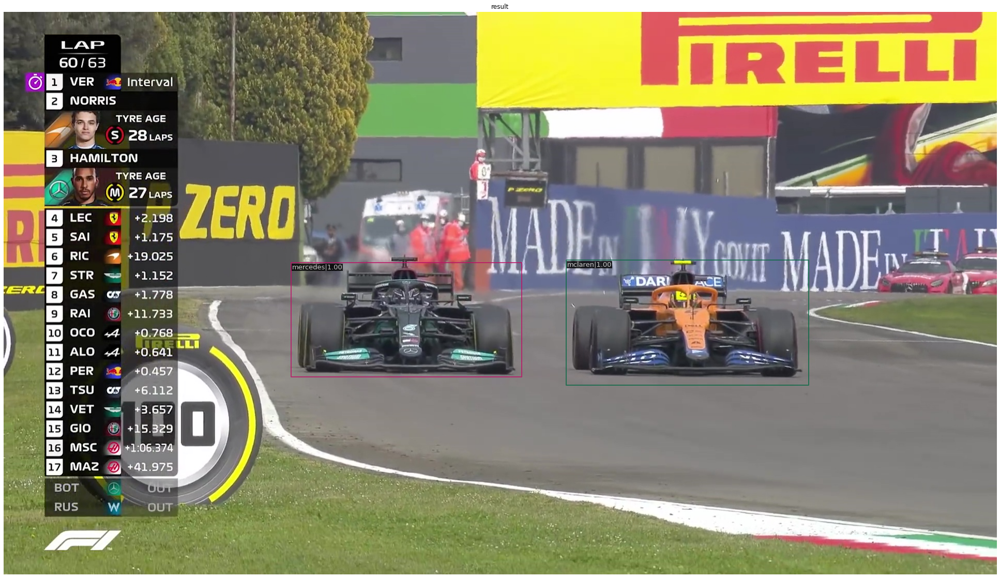

In [ ]:
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector

img = mmcv.imread('/content/mmdet_data_f1/images_val/7c1ba889-scene16661.jpg')

model.cfg = cfg
result = inference_detector(model, img)
show_result_pyplot(model, img, result)

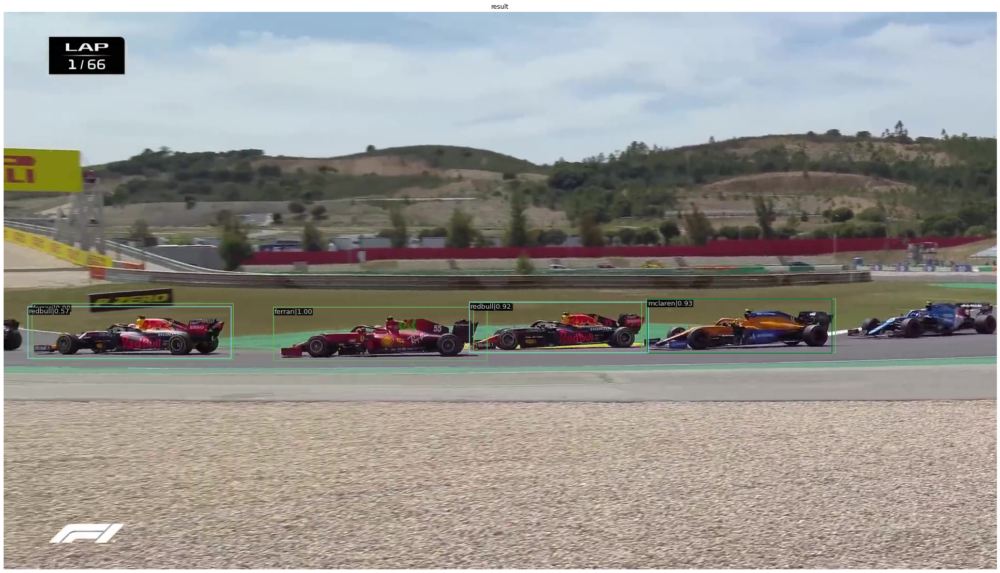

In [ ]:
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector

img = mmcv.imread('/content/mmdet_data_f1/images_val/eec15143-porto00821.jpg')

model.cfg = cfg
result = inference_detector(model, img)
show_result_pyplot(model, img, result)


**Video Üzerinden Test**

In [ ]:
!python /content/mmdetection/demo/video_demo.py /content/drive/MyDrive/videoplayback_test.mp4 --score-thr 0.60 \
/content/mmdetection/config.py \
/content/mmdetection/tutorial_exps/latest.pth \
--out mmdet_video.mp4 

/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
load checkpoint from local path: /content/mmdetection/tutorial_exps/latest.pth
[                                                  ] 0/11204, elapsed: 0s, ETA:/content/mmdetection/mmdet/datasets/utils.py:66: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to cha